## GraphFrames Overview
GraphFrames is a package for Apache Spark which provides DataFrame-based Graphs. It provides high-level APIs in Scala, Java, and Python. It aims to provide both the functionality of GraphX and extended functionality taking advantage of Spark DataFrames. This extended functionality includes motif finding, DataFrame-based serialization, and highly expressive graph queries.
- <b>GraphFrame</b> is a powerful abstraction for processing large graphs using distributed computing. 
- It provides a plethora of common graph algorithms including label propagation and PageRank, as well as it provides the foundations for implementing complex graph algorithms. 
- Vertices and edges are represented as dataframes instead of resilient distributed datasets (RDD). 
- GraphFrames simplify the graph data analytics pipeline and optimize the queries across data graph and relational data. 
- GraphFrames support <b>Python and Java apart from Scala APIs <i>(whereas GraphX supports Scala only)</i></b> . Apart from this advantage GraphFrames also save and load graphs using formats like Parquet, JSON, and CSV files.

## What are GraphFrames?
<h3><i><center>GraphX is to RDDs as GraphFrames are to DataFrames.</center></i></h3>

- <b>GraphFrames</b> represent graphs: <b>vertices (e.g., users)</b> and <b>edges (e.g., relationships between users)</b>.
- <b>GraphFrames</b> also provide powerful tools for running queries and standard graph algorithms. 
- With <b>GraphFrames</b>, you can easily search for patterns within graphs, find important vertices, and more. 

## Start using GraphFrames
### The following example shows how to create a GraphFrame, query it, and run the PageRank algorithm.

In [1]:
import pyspark
from pyspark.sql import SparkSession
spark = SparkSession.builder.appName('graphframes').getOrCreate()

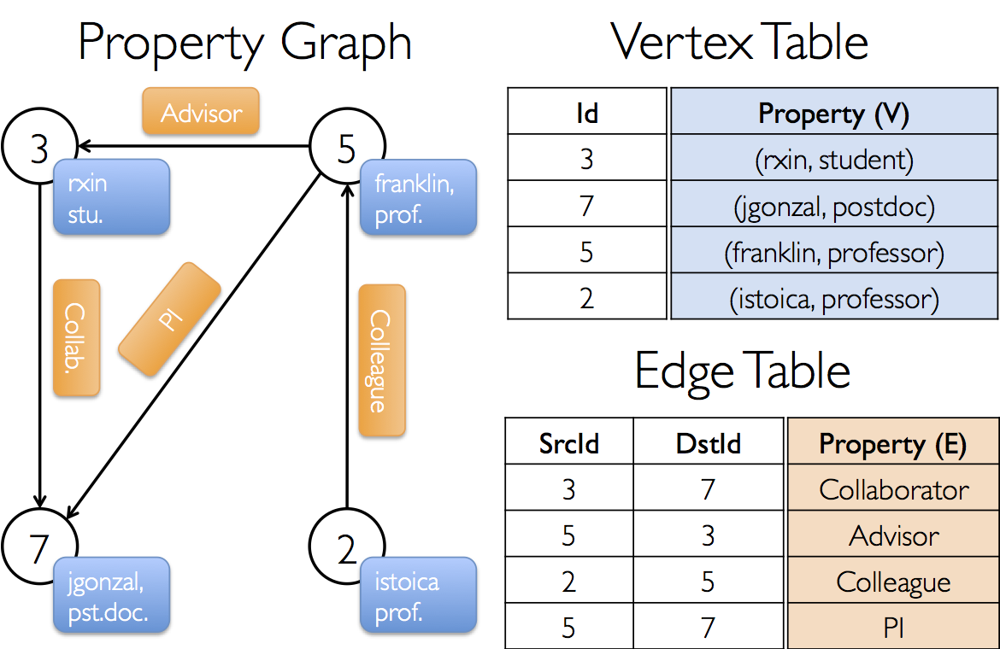

## Creating GraphFrames
<b><i>Users can create GraphFrames from vertex and edge DataFrames.</i></b>
- <b>Vertex DataFrame:</b> A vertex DataFrame should contain a special column named <b>“id”</b> which specifies unique IDs for each vertex in the graph.
- <b><i>Edge DataFrame:</b></i> An edge DataFrame should contain two special columns: “src” (source vertex ID of edge) and “dst” (destination vertex ID of edge).

In [27]:
# Create a Vertex DataFrame with unique ID column "id"
vert = spark.createDataFrame([(3,'rxin','student'),
                             (7,'jgonzal','postdoc'),
                             (5,'franklin','professor'),
                             (2,'istoica','professor')],
                            ["id", "TheName", "position"])

In [28]:
vert.show()

+---+--------+---------+
| id| TheName| position|
+---+--------+---------+
|  3|    rxin|  student|
|  7| jgonzal|  postdoc|
|  5|franklin|professor|
|  2| istoica|professor|
+---+--------+---------+



In [29]:
# Create an Edge DataFrame with "src" and "dst" columns
Edg = spark.createDataFrame([(3,7,'Collaborator'),
                             (5,3,'Advisor'),
                             (2,5,'Colleague'),
                             (5,7,'Pl')],
                           ["src", "dst", "TheRelationship"])

In [30]:
Edg.show()

+---+---+---------------+
|src|dst|TheRelationship|
+---+---+---------------+
|  3|  7|   Collaborator|
|  5|  3|        Advisor|
|  2|  5|      Colleague|
|  5|  7|             Pl|
+---+---+---------------+



In [31]:
from graphframes import *

In [32]:
# Create a GraphFrame
gf = GraphFrame(vert,Edg)

In [33]:
gf.vertices.show()

+---+--------+---------+
| id| TheName| position|
+---+--------+---------+
|  3|    rxin|  student|
|  7| jgonzal|  postdoc|
|  5|franklin|professor|
|  2| istoica|professor|
+---+--------+---------+



In [34]:
gf.edges.show()

+---+---+---------------+
|src|dst|TheRelationship|
+---+---+---------------+
|  3|  7|   Collaborator|
|  5|  3|        Advisor|
|  2|  5|      Colleague|
|  5|  7|             Pl|
+---+---+---------------+



In [35]:
# Create a Vertex DataFrame with unique ID column "id"
vert = spark.createDataFrame([(3,'rxin','student','rich'),
                             (7,'jgonzal','postdoc','poor'),
                             (5,'franklin','professor','funny'),
                             (2,'istoica','professor','stable')],
                            ["id", "TheName", "position",'State'])

In [36]:
vert.show()

+---+--------+---------+------+
| id| TheName| position| State|
+---+--------+---------+------+
|  3|    rxin|  student|  rich|
|  7| jgonzal|  postdoc|  poor|
|  5|franklin|professor| funny|
|  2| istoica|professor|stable|
+---+--------+---------+------+



In [37]:
# Create an Edge DataFrame with "src" and "dst" columns
Edg = spark.createDataFrame([(3,7,'Collaborator'),
                             (5,3,'Advisor'),
                             (2,5,'Colleague'),
                             (5,7,'Pl')],
                           ["src", "dst", "TheRelationship"])

In [38]:
Edg.show()

+---+---+---------------+
|src|dst|TheRelationship|
+---+---+---------------+
|  3|  7|   Collaborator|
|  5|  3|        Advisor|
|  2|  5|      Colleague|
|  5|  7|             Pl|
+---+---+---------------+



In [39]:
from graphframes import *

In [40]:
# Create a GraphFrame
gf = GraphFrame(vert,Edg)

In [41]:
gf.vertices.show()

+---+--------+---------+------+
| id| TheName| position| State|
+---+--------+---------+------+
|  3|    rxin|  student|  rich|
|  7| jgonzal|  postdoc|  poor|
|  5|franklin|professor| funny|
|  2| istoica|professor|stable|
+---+--------+---------+------+



In [42]:
gf.edges.show()

+---+---+---------------+
|src|dst|TheRelationship|
+---+---+---------------+
|  3|  7|   Collaborator|
|  5|  3|        Advisor|
|  2|  5|      Colleague|
|  5|  7|             Pl|
+---+---+---------------+



In [43]:
# Create a Vertex DataFrame with unique ID column "id"
v = spark.createDataFrame([("a", "Alice", 34,'Married'),
                           ("b", "Bob", 36,'Married'),
                           ("c", "Charlie", 30,'Single')]
                          ,["id", "name", "age",'status'])

In [44]:
v.show()

+---+-------+---+-------+
| id|   name|age| status|
+---+-------+---+-------+
|  a|  Alice| 34|Married|
|  b|    Bob| 36|Married|
|  c|Charlie| 30| Single|
+---+-------+---+-------+



In [45]:
# Create an Edge DataFrame with "src" and "dst" columns
e = spark.createDataFrame([("a", "b", "friend",'lover'),
                           ("b", "c", "follow",'student'),
                           ("c", "b", "follow",'student')]
                          ,["src", "dst", "relative",'relationship'])

In [46]:
e.show()

+---+---+--------+------------+
|src|dst|relative|relationship|
+---+---+--------+------------+
|  a|  b|  friend|       lover|
|  b|  c|  follow|     student|
|  c|  b|  follow|     student|
+---+---+--------+------------+



In [47]:
# Create a GraphFrame
g = GraphFrame(v, e)

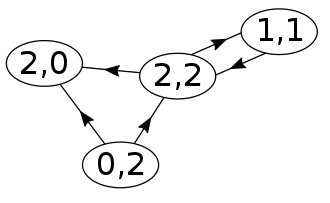
<i><center><b>A directed graph with vertices labeled (indegree, outdegree)</i></center></b>

In [48]:
# Query: Get in-degree of each vertex.
g.inDegrees.show()

+---+--------+
| id|inDegree|
+---+--------+
|  b|       2|
|  c|       1|
+---+--------+



In [49]:
g.inDegrees

DataFrame[id: string, inDegree: int]

In [50]:
# Query: Get out-degree of each vertex.
g.outDegrees.show()

+---+---------+
| id|outDegree|
+---+---------+
|  a|        1|
|  c|        1|
|  b|        1|
+---+---------+



In [53]:
# Query: Count the number of "follow" connections in the graph.
g.edges.filter('relative = "follow"').show()

+---+---+--------+------------+
|src|dst|relative|relationship|
+---+---+--------+------------+
|  b|  c|  follow|     student|
|  c|  b|  follow|     student|
+---+---+--------+------------+



In [54]:
g.edges.filter('relative = "follow"').count()

2

In [55]:
g.edges.filter('relationship = "student"').count()

2

In [56]:
# Run PageRank algorithm, and show results.
results = g.pageRank(resetProbability=0.01, maxIter=20)

In [57]:
results

GraphFrame(v:[id: string, name: string ... 3 more fields], e:[src: string, dst: string ... 3 more fields])

In [58]:
results.vertices.show()

+---+-------+---+-------+------------------+
| id|   name|age| status|          pagerank|
+---+-------+---+-------+------------------+
|  c|Charlie| 30| Single|1.8994109890559092|
|  b|    Bob| 36|Married|1.0905890109440908|
|  a|  Alice| 34|Married|              0.01|
+---+-------+---+-------+------------------+



In [59]:
results.edges.show()

+---+---+--------+------------+------+
|src|dst|relative|relationship|weight|
+---+---+--------+------------+------+
|  a|  b|  friend|       lover|   1.0|
|  b|  c|  follow|     student|   1.0|
|  c|  b|  follow|     student|   1.0|
+---+---+--------+------------+------+



In [60]:
results.vertices.select("id", "pagerank").show()

+---+------------------+
| id|          pagerank|
+---+------------------+
|  c|1.8994109890559092|
|  b|1.0905890109440908|
|  a|              0.01|
+---+------------------+



In [61]:
from pyspark.sql.functions import *

In [62]:
results.vertices.select("id", "pagerank").orderBy(col('pagerank').desc()).show()

+---+------------------+
| id|          pagerank|
+---+------------------+
|  c|1.8994109890559092|
|  b|1.0905890109440908|
|  a|              0.01|
+---+------------------+



In [63]:
# Vertex DataFrame
v = spark.createDataFrame([
  ("a", "Alice", 34),
  ("b", "Bob", 36),
  ("c", "Charlie", 30),
  ("d", "David", 29),
  ("e", "Esther", 32),
  ("f", "Fanny", 36),
  ("g", "Gabby", 60)
], ["id", "name", "age"])
# Edge DataFrame
e = spark.createDataFrame([
  ("a", "b", "friend"),
  ("b", "c", "follow"),
  ("c", "b", "follow"),
  ("f", "c", "follow"),
  ("e", "f", "follow"),
  ("e", "d", "friend"),
  ("d", "a", "friend"),
  ("a", "e", "friend")
], ["src", "dst", "relationship"])
# Create a GraphFrame
g = GraphFrame(v, e)

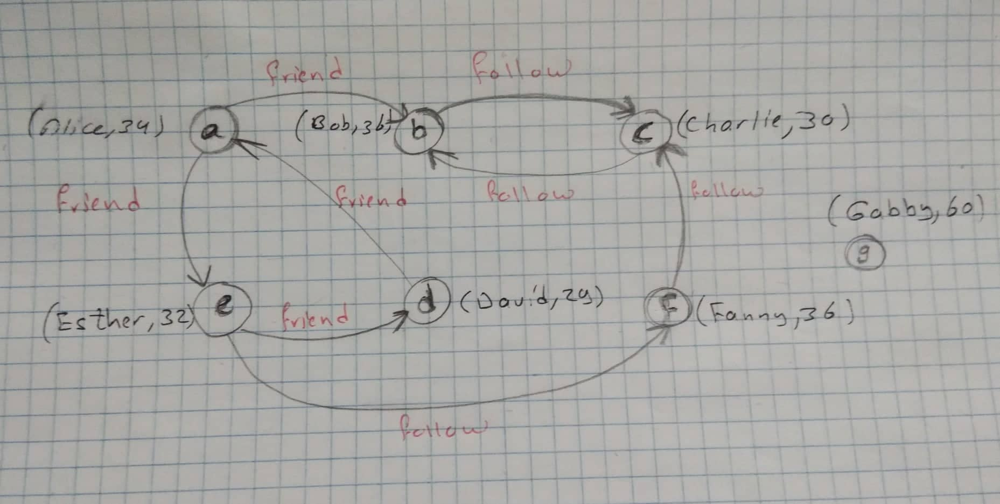

## Basic graph and DataFrame queries
- GraphFrames provide several simple graph queries, such as node degree.
- Also, since GraphFrames represent graphs as pairs of vertex and edge DataFrames, it is easy to make powerful queries directly on the vertex and edge DataFrames. Those DataFrames are made available as vertices and edges fields in the GraphFrame.

In [72]:
g.vertices.show()

+---+-------+---+
| id|   name|age|
+---+-------+---+
|  a|  Alice| 34|
|  b|    Bob| 36|
|  c|Charlie| 30|
|  d|  David| 29|
|  e| Esther| 32|
|  f|  Fanny| 36|
|  g|  Gabby| 60|
+---+-------+---+



In [73]:
g.edges.show()

+---+---+------------+
|src|dst|relationship|
+---+---+------------+
|  a|  b|      friend|
|  b|  c|      follow|
|  c|  b|      follow|
|  f|  c|      follow|
|  e|  f|      follow|
|  e|  d|      friend|
|  d|  a|      friend|
|  a|  e|      friend|
+---+---+------------+



In [74]:
# Get a DataFrame with columns "id" and "inDegree" (in-degree)
vertexInDegrees = g.inDegrees
vertexInDegrees.show()

+---+--------+
| id|inDegree|
+---+--------+
|  c|       2|
|  b|       2|
|  f|       1|
|  e|       1|
|  d|       1|
|  a|       1|
+---+--------+



In [75]:
# Get a DataFrame with columns "id" and "outDegrees" (out-degree)
vertexoutDegrees = g.outDegrees
vertexoutDegrees.show()

+---+---------+
| id|outDegree|
+---+---------+
|  f|        1|
|  c|        1|
|  b|        1|
|  a|        2|
|  e|        2|
|  d|        1|
+---+---------+



In [82]:
# Find the youngest user's age in the graph.
# This queries the vertex DataFrame.
g.vertices.select(min('age').alias('minAge')).show()

+------+
|minAge|
+------+
|    29|
+------+



In [79]:
g.vertices.show()

+---+-------+---+
| id|   name|age|
+---+-------+---+
|  a|  Alice| 34|
|  b|    Bob| 36|
|  c|Charlie| 30|
|  d|  David| 29|
|  e| Esther| 32|
|  f|  Fanny| 36|
|  g|  Gabby| 60|
+---+-------+---+



In [85]:
# Find the youngest user's age in the graph.
# This queries the vertex DataFrame.
g.vertices.groupBy().min("age").show()

+--------+
|min(age)|
+--------+
|      29|
+--------+



In [86]:
numFollows = g.edges.filter("relationship = 'follow'").show()

+---+---+------------+
|src|dst|relationship|
+---+---+------------+
|  b|  c|      follow|
|  c|  b|      follow|
|  f|  c|      follow|
|  e|  f|      follow|
+---+---+------------+



In [87]:
# Count the number of "follows" in the graph.
# This queries the edge DataFrame.
numFollows = g.edges.filter("relationship = 'follow'").count()
numFollows

4

## Motif finding
- Motif finding refers to searching for structural patterns in a graph.
- GraphFrame motif finding uses a simple Domain-Specific Language (DSL) for expressing structural queries. <br>For example, <b>graph.find("(a)-[e]->(b); (b)-[e2]->(a)")</b> will search for pairs of vertices a,b connected by edges in both directions. It will return a DataFrame of all such structures in the graph, with columns for each of the named elements (vertices or edges) in the motif. In this case, the returned columns will be<b> “a, b, e, e2.”</b>

In [89]:
# Search for pairs of vertices with edges in both directions between them.
motifs = g.find("(v1)-[e1]->(v2); (v2)-[e2]->(v1)")
motifs.show()

+----------------+--------------+----------------+--------------+
|              v1|            e1|              v2|            e2|
+----------------+--------------+----------------+--------------+
|{c, Charlie, 30}|{c, b, follow}|    {b, Bob, 36}|{b, c, follow}|
|    {b, Bob, 36}|{b, c, follow}|{c, Charlie, 30}|{c, b, follow}|
+----------------+--------------+----------------+--------------+



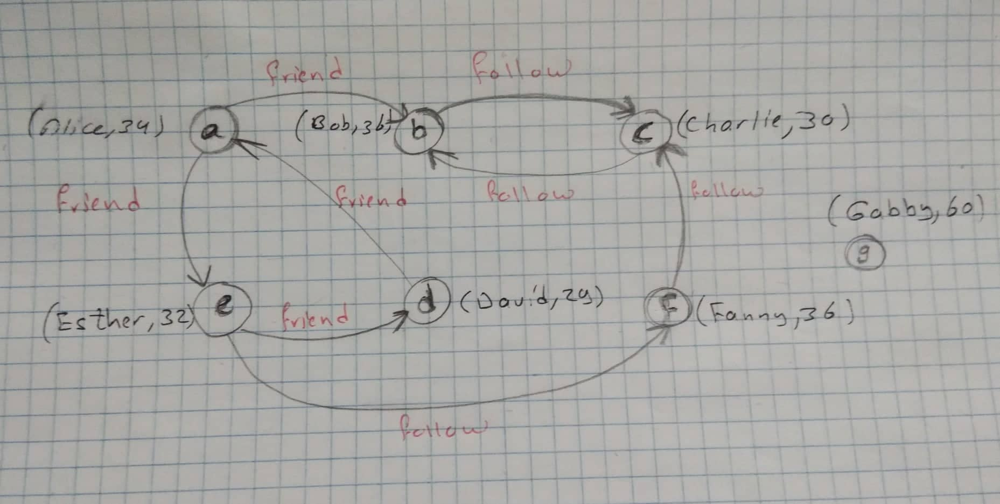

In [103]:
motifs.printSchema()

root
 |-- v1: struct (nullable = false)
 |    |-- id: string (nullable = true)
 |    |-- name: string (nullable = true)
 |    |-- age: long (nullable = true)
 |-- e1: struct (nullable = false)
 |    |-- src: string (nullable = true)
 |    |-- dst: string (nullable = true)
 |    |-- relationship: string (nullable = true)
 |-- v2: struct (nullable = false)
 |    |-- id: string (nullable = true)
 |    |-- name: string (nullable = true)
 |    |-- age: long (nullable = true)
 |-- e2: struct (nullable = false)
 |    |-- src: string (nullable = true)
 |    |-- dst: string (nullable = true)
 |    |-- relationship: string (nullable = true)



In [105]:
motifs.select('v1.age').show()

+---+
|age|
+---+
| 30|
| 36|
+---+



In [106]:
motifs.where('v1.age > 30').show()

+------------+--------------+----------------+--------------+
|          v1|            e1|              v2|            e2|
+------------+--------------+----------------+--------------+
|{b, Bob, 36}|{b, c, follow}|{c, Charlie, 30}|{c, b, follow}|
+------------+--------------+----------------+--------------+



In [97]:
motifs.collect()

[Row(v1=Row(id='c', name='Charlie', age=30), e1=Row(src='c', dst='b', relationship='follow'), v2=Row(id='b', name='Bob', age=36), e2=Row(src='b', dst='c', relationship='follow')),
 Row(v1=Row(id='b', name='Bob', age=36), e1=Row(src='b', dst='c', relationship='follow'), v2=Row(id='c', name='Charlie', age=30), e2=Row(src='c', dst='b', relationship='follow'))]

In [98]:
motifs.collect()[0]

Row(v1=Row(id='c', name='Charlie', age=30), e1=Row(src='c', dst='b', relationship='follow'), v2=Row(id='b', name='Bob', age=36), e2=Row(src='b', dst='c', relationship='follow'))

In [101]:
motifs.collect()[0].v1

Row(id='c', name='Charlie', age=30)

In [102]:
motifs.collect()[0].v1.name

'Charlie'

In [108]:
# More complex queries can be expressed by applying filters.
motifs.filter("v2.age > 30").show()

+----------------+--------------+------------+--------------+
|              v1|            e1|          v2|            e2|
+----------------+--------------+------------+--------------+
|{c, Charlie, 30}|{c, b, follow}|{b, Bob, 36}|{b, c, follow}|
+----------------+--------------+------------+--------------+



In [109]:
motifs.filter("v1.age <35").show()

+----------------+--------------+------------+--------------+
|              v1|            e1|          v2|            e2|
+----------------+--------------+------------+--------------+
|{c, Charlie, 30}|{c, b, follow}|{b, Bob, 36}|{b, c, follow}|
+----------------+--------------+------------+--------------+



In [110]:
motifs.filter("e1['relationship'] = 'follow'").show()

+----------------+--------------+----------------+--------------+
|              v1|            e1|              v2|            e2|
+----------------+--------------+----------------+--------------+
|{c, Charlie, 30}|{c, b, follow}|    {b, Bob, 36}|{b, c, follow}|
|    {b, Bob, 36}|{b, c, follow}|{c, Charlie, 30}|{c, b, follow}|
+----------------+--------------+----------------+--------------+



In [111]:
motifs.filter("e1.relationship != 'follow'").show()

+---+---+---+---+
| v1| e1| v2| e2|
+---+---+---+---+
+---+---+---+---+



## DSL for expressing structural patterns:
- The basic unit of a pattern is an edge. For example, <b>"(a)-[e]->(b)</b>" expresses an edge <b>e</b> from vertex <b>a</b> to vertex <b>b</b>. Note that vertices are denoted by parentheses <b>(a)</b>, while edges are denoted by square brackets <b>[e]</b>.
- A pattern is expressed as a union of edges. Edge patterns can be joined with semicolons. Motif <b>"(a)-[e]->(b); (b)-[e2]->(c)" </b>specifies two edges from a to b to c.

In [112]:
motifs_2 = g.find("(a)-[e]->(b); (b)-[e2]->(c)")
motifs_2.show()

+----------------+--------------+----------------+--------------+----------------+
|               a|             e|               b|            e2|               c|
+----------------+--------------+----------------+--------------+----------------+
| {e, Esther, 32}|{e, d, friend}|  {d, David, 29}|{d, a, friend}|  {a, Alice, 34}|
|  {d, David, 29}|{d, a, friend}|  {a, Alice, 34}|{a, b, friend}|    {b, Bob, 36}|
|  {f, Fanny, 36}|{f, c, follow}|{c, Charlie, 30}|{c, b, follow}|    {b, Bob, 36}|
|    {b, Bob, 36}|{b, c, follow}|{c, Charlie, 30}|{c, b, follow}|    {b, Bob, 36}|
|{c, Charlie, 30}|{c, b, follow}|    {b, Bob, 36}|{b, c, follow}|{c, Charlie, 30}|
|  {a, Alice, 34}|{a, b, friend}|    {b, Bob, 36}|{b, c, follow}|{c, Charlie, 30}|
| {e, Esther, 32}|{e, f, follow}|  {f, Fanny, 36}|{f, c, follow}|{c, Charlie, 30}|
|  {a, Alice, 34}|{a, e, friend}| {e, Esther, 32}|{e, d, friend}|  {d, David, 29}|
|  {d, David, 29}|{d, a, friend}|  {a, Alice, 34}|{a, e, friend}| {e, Esther, 32}|
|  {

In [117]:
motifs_2_1 = g.find("(a)-[e]->(b); (b)-[e2]->(c); (c)-[e3]->(d)")

In [118]:
from IPython.display import display, HTML
display(HTML("<style>pre { white-space: pre !important; }</style>"))

In [119]:
motifs_2_1.show()

+----------------+--------------+----------------+--------------+----------------+--------------+----------------+
|               a|             e|               b|            e2|               c|            e3|               d|
+----------------+--------------+----------------+--------------+----------------+--------------+----------------+
|  {a, Alice, 34}|{a, e, friend}| {e, Esther, 32}|{e, d, friend}|  {d, David, 29}|{d, a, friend}|  {a, Alice, 34}|
| {e, Esther, 32}|{e, f, follow}|  {f, Fanny, 36}|{f, c, follow}|{c, Charlie, 30}|{c, b, follow}|    {b, Bob, 36}|
|  {a, Alice, 34}|{a, b, friend}|    {b, Bob, 36}|{b, c, follow}|{c, Charlie, 30}|{c, b, follow}|    {b, Bob, 36}|
|{c, Charlie, 30}|{c, b, follow}|    {b, Bob, 36}|{b, c, follow}|{c, Charlie, 30}|{c, b, follow}|    {b, Bob, 36}|
| {e, Esther, 32}|{e, d, friend}|  {d, David, 29}|{d, a, friend}|  {a, Alice, 34}|{a, b, friend}|    {b, Bob, 36}|
|  {a, Alice, 34}|{a, e, friend}| {e, Esther, 32}|{e, f, follow}|  {f, Fanny, 36

In [120]:
motifs_2_1.select('a','b','c','d').show()

+----------------+----------------+----------------+----------------+
|               a|               b|               c|               d|
+----------------+----------------+----------------+----------------+
|  {a, Alice, 34}| {e, Esther, 32}|  {d, David, 29}|  {a, Alice, 34}|
| {e, Esther, 32}|  {f, Fanny, 36}|{c, Charlie, 30}|    {b, Bob, 36}|
|  {a, Alice, 34}|    {b, Bob, 36}|{c, Charlie, 30}|    {b, Bob, 36}|
|{c, Charlie, 30}|    {b, Bob, 36}|{c, Charlie, 30}|    {b, Bob, 36}|
| {e, Esther, 32}|  {d, David, 29}|  {a, Alice, 34}|    {b, Bob, 36}|
|  {a, Alice, 34}| {e, Esther, 32}|  {f, Fanny, 36}|{c, Charlie, 30}|
|    {b, Bob, 36}|{c, Charlie, 30}|    {b, Bob, 36}|{c, Charlie, 30}|
|  {f, Fanny, 36}|{c, Charlie, 30}|    {b, Bob, 36}|{c, Charlie, 30}|
|  {d, David, 29}|  {a, Alice, 34}|    {b, Bob, 36}|{c, Charlie, 30}|
|  {d, David, 29}|  {a, Alice, 34}| {e, Esther, 32}|  {d, David, 29}|
| {e, Esther, 32}|  {d, David, 29}|  {a, Alice, 34}| {e, Esther, 32}|
|  {d, David, 29}|  

In [121]:
motifs_2_1.select('e','e2','e3').show()

+--------------+--------------+--------------+
|             e|            e2|            e3|
+--------------+--------------+--------------+
|{a, e, friend}|{e, d, friend}|{d, a, friend}|
|{e, f, follow}|{f, c, follow}|{c, b, follow}|
|{a, b, friend}|{b, c, follow}|{c, b, follow}|
|{c, b, follow}|{b, c, follow}|{c, b, follow}|
|{e, d, friend}|{d, a, friend}|{a, b, friend}|
|{a, e, friend}|{e, f, follow}|{f, c, follow}|
|{b, c, follow}|{c, b, follow}|{b, c, follow}|
|{f, c, follow}|{c, b, follow}|{b, c, follow}|
|{d, a, friend}|{a, b, friend}|{b, c, follow}|
|{d, a, friend}|{a, e, friend}|{e, d, friend}|
|{e, d, friend}|{d, a, friend}|{a, e, friend}|
|{d, a, friend}|{a, e, friend}|{e, f, follow}|
+--------------+--------------+--------------+



- Within a pattern, names can be assigned to vertices and edges. For example, <b>"(a)-[e]->(b)"</b> has three named elements: <b>vertices a,b and edge e</b>. These names serve two purposes:
    - The names can identify common elements among edges. For example, <b>"(a)-[e]->(b); (b)-[e2]->(c)"</b> specifies that the same vertex b is the destination of edge e and source of edge e2.
    - Be aware that names <i><b>do not identify distinct elements<b></i>: two elements with different names may refer to the same graph element. For example, in the motif "(a)-[e]->(b); (b)-[e2]->(c)", the names a and c could refer to the same vertex. To restrict named elements to be distinct vertices or edges, use post-hoc filters such as resultDataframe.filter("a.id != c.id").

In [122]:
motifs_3 = g.find("(ver1)-[edg]->(ver2); (ver2)-[edg2]->(ver3)")
motifs_3.show()

+----------------+--------------+----------------+--------------+----------------+
|            ver1|           edg|            ver2|          edg2|            ver3|
+----------------+--------------+----------------+--------------+----------------+
| {e, Esther, 32}|{e, d, friend}|  {d, David, 29}|{d, a, friend}|  {a, Alice, 34}|
|  {d, David, 29}|{d, a, friend}|  {a, Alice, 34}|{a, b, friend}|    {b, Bob, 36}|
|  {f, Fanny, 36}|{f, c, follow}|{c, Charlie, 30}|{c, b, follow}|    {b, Bob, 36}|
|    {b, Bob, 36}|{b, c, follow}|{c, Charlie, 30}|{c, b, follow}|    {b, Bob, 36}|
|{c, Charlie, 30}|{c, b, follow}|    {b, Bob, 36}|{b, c, follow}|{c, Charlie, 30}|
|  {a, Alice, 34}|{a, b, friend}|    {b, Bob, 36}|{b, c, follow}|{c, Charlie, 30}|
| {e, Esther, 32}|{e, f, follow}|  {f, Fanny, 36}|{f, c, follow}|{c, Charlie, 30}|
|  {a, Alice, 34}|{a, e, friend}| {e, Esther, 32}|{e, d, friend}|  {d, David, 29}|
|  {d, David, 29}|{d, a, friend}|  {a, Alice, 34}|{a, e, friend}| {e, Esther, 32}|
|  {

In [123]:
motifs_3.filter('ver1.id != ver3.id').show()

+---------------+--------------+----------------+--------------+----------------+
|           ver1|           edg|            ver2|          edg2|            ver3|
+---------------+--------------+----------------+--------------+----------------+
|{e, Esther, 32}|{e, d, friend}|  {d, David, 29}|{d, a, friend}|  {a, Alice, 34}|
| {d, David, 29}|{d, a, friend}|  {a, Alice, 34}|{a, b, friend}|    {b, Bob, 36}|
| {f, Fanny, 36}|{f, c, follow}|{c, Charlie, 30}|{c, b, follow}|    {b, Bob, 36}|
| {a, Alice, 34}|{a, b, friend}|    {b, Bob, 36}|{b, c, follow}|{c, Charlie, 30}|
|{e, Esther, 32}|{e, f, follow}|  {f, Fanny, 36}|{f, c, follow}|{c, Charlie, 30}|
| {a, Alice, 34}|{a, e, friend}| {e, Esther, 32}|{e, d, friend}|  {d, David, 29}|
| {d, David, 29}|{d, a, friend}|  {a, Alice, 34}|{a, e, friend}| {e, Esther, 32}|
| {a, Alice, 34}|{a, e, friend}| {e, Esther, 32}|{e, f, follow}|  {f, Fanny, 36}|
+---------------+--------------+----------------+--------------+----------------+



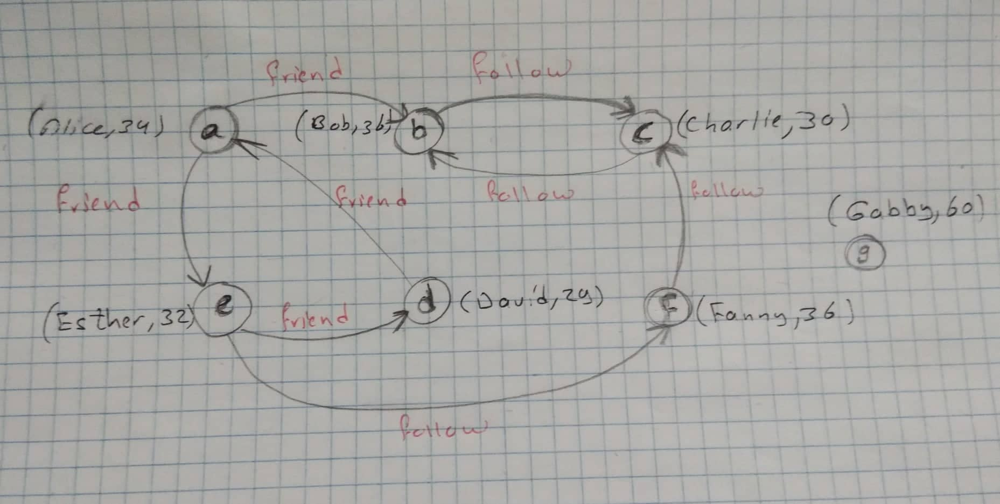

In [124]:
motifs_3.filter('ver1.id == ver3.id').show()

+----------------+--------------+----------------+--------------+----------------+
|            ver1|           edg|            ver2|          edg2|            ver3|
+----------------+--------------+----------------+--------------+----------------+
|    {b, Bob, 36}|{b, c, follow}|{c, Charlie, 30}|{c, b, follow}|    {b, Bob, 36}|
|{c, Charlie, 30}|{c, b, follow}|    {b, Bob, 36}|{b, c, follow}|{c, Charlie, 30}|
+----------------+--------------+----------------+--------------+----------------+



- It is acceptable to omit names for vertices or edges in motifs when not needed. E.g., <b>"(a)-[]->(b)"</b> expresses an edge between vertices a,b but does not assign a name to the edge. There will be no column for the <b>anonymous</b> edge in the result DataFrame. Similarly, <b>"(a)-[e]->()"</b> indicates an out-edge of vertex a but does not name the destination vertex. These are called <b><i>anonymous</i></b> vertices and edges.

In [125]:
motifs_4 = g.find("(a)-[]->(b)")
motifs_4.show()

+----------------+----------------+
|               a|               b|
+----------------+----------------+
|  {f, Fanny, 36}|{c, Charlie, 30}|
|    {b, Bob, 36}|{c, Charlie, 30}|
|{c, Charlie, 30}|    {b, Bob, 36}|
|  {a, Alice, 34}|    {b, Bob, 36}|
|  {d, David, 29}|  {a, Alice, 34}|
| {e, Esther, 32}|  {f, Fanny, 36}|
|  {a, Alice, 34}| {e, Esther, 32}|
| {e, Esther, 32}|  {d, David, 29}|
+----------------+----------------+



In [126]:
g.inDegrees.show()

+---+--------+
| id|inDegree|
+---+--------+
|  c|       2|
|  b|       2|
|  f|       1|
|  e|       1|
|  d|       1|
|  a|       1|
+---+--------+



In [127]:
g.outDegrees.show()

+---+---------+
| id|outDegree|
+---+---------+
|  f|        1|
|  c|        1|
|  b|        1|
|  a|        2|
|  e|        2|
|  d|        1|
+---+---------+



In [128]:
motifs_5 = g.find("(a)-[e]->()")
motifs_5.show()

+----------------+--------------+
|               a|             e|
+----------------+--------------+
|  {a, Alice, 34}|{a, b, friend}|
|  {a, Alice, 34}|{a, e, friend}|
|    {b, Bob, 36}|{b, c, follow}|
|{c, Charlie, 30}|{c, b, follow}|
|  {d, David, 29}|{d, a, friend}|
| {e, Esther, 32}|{e, f, follow}|
| {e, Esther, 32}|{e, d, friend}|
|  {f, Fanny, 36}|{f, c, follow}|
+----------------+--------------+



In [129]:
motifs_5_1 = g.find("()-[e]->(b)")
motifs_5_1.show()

+--------------+----------------+
|             e|               b|
+--------------+----------------+
|{d, a, friend}|  {a, Alice, 34}|
|{a, b, friend}|    {b, Bob, 36}|
|{c, b, follow}|    {b, Bob, 36}|
|{b, c, follow}|{c, Charlie, 30}|
|{f, c, follow}|{c, Charlie, 30}|
|{e, d, friend}|  {d, David, 29}|
|{a, e, friend}| {e, Esther, 32}|
|{e, f, follow}|  {f, Fanny, 36}|
+--------------+----------------+



- An edge can be negated to indicate that the edge should <i>not</i> be present in the graph. E.g., <b>"(a)-[]->(b); !(b)-[]->(a)" </b>finds edges from a to b for which there is no edge from b to a.

In [130]:
motfis_6=g.find("(a)-[e1]->(b);!(b)-[]->(a)")
motfis_6.show()

+---------------+--------------+----------------+
|              a|            e1|               b|
+---------------+--------------+----------------+
| {a, Alice, 34}|{a, e, friend}| {e, Esther, 32}|
|{e, Esther, 32}|{e, f, follow}|  {f, Fanny, 36}|
| {a, Alice, 34}|{a, b, friend}|    {b, Bob, 36}|
|{e, Esther, 32}|{e, d, friend}|  {d, David, 29}|
| {f, Fanny, 36}|{f, c, follow}|{c, Charlie, 30}|
| {d, David, 29}|{d, a, friend}|  {a, Alice, 34}|
+---------------+--------------+----------------+



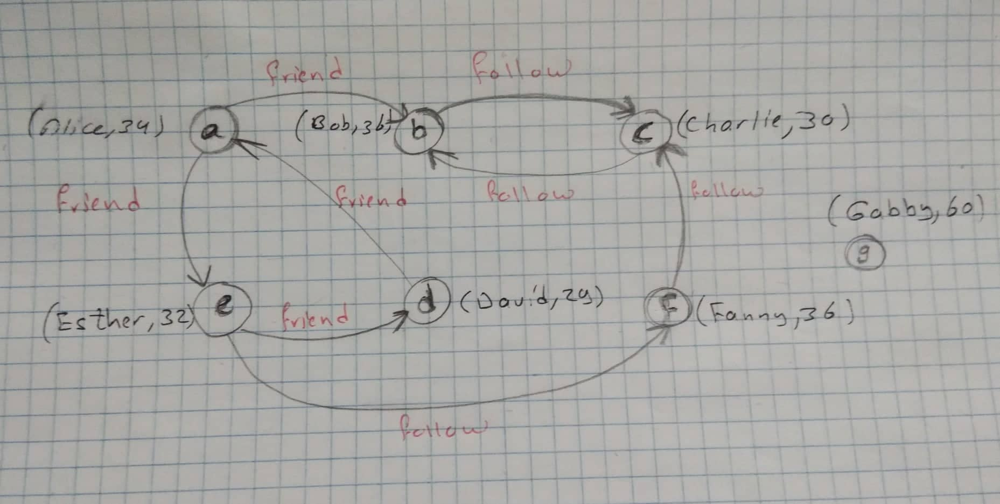

In [132]:
motfis_6=g.find("(a)-[]->(b);!(b)-[]->(a)")
motfis_6.show()

+---------------+----------------+
|              a|               b|
+---------------+----------------+
| {a, Alice, 34}| {e, Esther, 32}|
|{e, Esther, 32}|  {d, David, 29}|
|{e, Esther, 32}|  {f, Fanny, 36}|
| {a, Alice, 34}|    {b, Bob, 36}|
| {f, Fanny, 36}|{c, Charlie, 30}|
| {d, David, 29}|  {a, Alice, 34}|
+---------------+----------------+



<b><font color='red'>Restrictions:</font></b>
- Motifs are not allowed to contain edges without any named elements: "()-[]->()" and "!()-[]->()" are prohibited terms.
- Motifs are not allowed to contain named edges within negated terms (since these named edges would never appear within results). E.g., <b>"!(a)-[ab]->(b)"</b> is invalid, but <b>"!(a)-[]->(b)"</b> is valid.

In [133]:
motfis_7=g.find("()-[]->();!()-[]->()")
motfis_7.show()

Py4JJavaError: An error occurred while calling o353.find.
: org.graphframes.InvalidParseException: Motif finding does not support completely anonymous edges ()-[]->().  Users can check for the existence of edges in the graph using the edges DataFrame.
	at org.graphframes.pattern.Pattern$.$anonfun$assertValidPatterns$1(patterns.scala:118)
	at org.graphframes.pattern.Pattern$.$anonfun$assertValidPatterns$1$adapted(patterns.scala:102)
	at scala.collection.immutable.List.foreach(List.scala:431)
	at org.graphframes.pattern.Pattern$.assertValidPatterns(patterns.scala:102)
	at org.graphframes.pattern.Pattern$.parse(patterns.scala:59)
	at org.graphframes.GraphFrame.find(GraphFrame.scala:332)
	at java.base/jdk.internal.reflect.NativeMethodAccessorImpl.invoke0(Native Method)
	at java.base/jdk.internal.reflect.NativeMethodAccessorImpl.invoke(NativeMethodAccessorImpl.java:62)
	at java.base/jdk.internal.reflect.DelegatingMethodAccessorImpl.invoke(DelegatingMethodAccessorImpl.java:43)
	at java.base/java.lang.reflect.Method.invoke(Method.java:566)
	at py4j.reflection.MethodInvoker.invoke(MethodInvoker.java:244)
	at py4j.reflection.ReflectionEngine.invoke(ReflectionEngine.java:357)
	at py4j.Gateway.invoke(Gateway.java:282)
	at py4j.commands.AbstractCommand.invokeMethod(AbstractCommand.java:132)
	at py4j.commands.CallCommand.execute(CallCommand.java:79)
	at py4j.ClientServerConnection.waitForCommands(ClientServerConnection.java:182)
	at py4j.ClientServerConnection.run(ClientServerConnection.java:106)
	at java.base/java.lang.Thread.run(Thread.java:834)


In [134]:
motfits_8=g.find("(a)-[e1]->(b);!(b)-[]->(a)")
motfits_8.show()

+---------------+--------------+----------------+
|              a|            e1|               b|
+---------------+--------------+----------------+
| {a, Alice, 34}|{a, e, friend}| {e, Esther, 32}|
|{e, Esther, 32}|{e, f, follow}|  {f, Fanny, 36}|
| {a, Alice, 34}|{a, b, friend}|    {b, Bob, 36}|
|{e, Esther, 32}|{e, d, friend}|  {d, David, 29}|
| {f, Fanny, 36}|{f, c, follow}|{c, Charlie, 30}|
| {d, David, 29}|{d, a, friend}|  {a, Alice, 34}|
+---------------+--------------+----------------+



In [135]:
motfis_9=g.find("(a)-[e1]->(b);!(b)-[e2]->(a)")
motfis_9.show()

Py4JJavaError: An error occurred while calling o353.find.
: org.graphframes.InvalidParseException: Motif finding does not support negated named edges, but the given pattern contained: !(NamedVertex(b))-[e2]->(NamedVertex(a))
	at org.graphframes.pattern.Pattern$.$anonfun$assertValidPatterns$1(patterns.scala:107)
	at org.graphframes.pattern.Pattern$.$anonfun$assertValidPatterns$1$adapted(patterns.scala:102)
	at scala.collection.immutable.List.foreach(List.scala:431)
	at org.graphframes.pattern.Pattern$.assertValidPatterns(patterns.scala:102)
	at org.graphframes.pattern.Pattern$.parse(patterns.scala:59)
	at org.graphframes.GraphFrame.find(GraphFrame.scala:332)
	at java.base/jdk.internal.reflect.NativeMethodAccessorImpl.invoke0(Native Method)
	at java.base/jdk.internal.reflect.NativeMethodAccessorImpl.invoke(NativeMethodAccessorImpl.java:62)
	at java.base/jdk.internal.reflect.DelegatingMethodAccessorImpl.invoke(DelegatingMethodAccessorImpl.java:43)
	at java.base/java.lang.reflect.Method.invoke(Method.java:566)
	at py4j.reflection.MethodInvoker.invoke(MethodInvoker.java:244)
	at py4j.reflection.ReflectionEngine.invoke(ReflectionEngine.java:357)
	at py4j.Gateway.invoke(Gateway.java:282)
	at py4j.commands.AbstractCommand.invokeMethod(AbstractCommand.java:132)
	at py4j.commands.CallCommand.execute(CallCommand.java:79)
	at py4j.ClientServerConnection.waitForCommands(ClientServerConnection.java:182)
	at py4j.ClientServerConnection.run(ClientServerConnection.java:106)
	at java.base/java.lang.Thread.run(Thread.java:834)


In [136]:
motifs_10 = g.find("(u)-[]->()")
motifs_10.show()

+----------------+
|               u|
+----------------+
|  {a, Alice, 34}|
|  {a, Alice, 34}|
|    {b, Bob, 36}|
|{c, Charlie, 30}|
|  {d, David, 29}|
| {e, Esther, 32}|
| {e, Esther, 32}|
|  {f, Fanny, 36}|
+----------------+



In [137]:
motifs_10.distinct().show()

+----------------+
|               u|
+----------------+
| {e, Esther, 32}|
|  {f, Fanny, 36}|
|    {b, Bob, 36}|
|{c, Charlie, 30}|
|  {a, Alice, 34}|
|  {d, David, 29}|
+----------------+



In [138]:
motifs_10.filter('u.age>30').show()

+---------------+
|              u|
+---------------+
| {a, Alice, 34}|
| {a, Alice, 34}|
|   {b, Bob, 36}|
|{e, Esther, 32}|
|{e, Esther, 32}|
| {f, Fanny, 36}|
+---------------+



In [139]:
motifs_10.filter('u.age>30').distinct().show()

+---------------+
|              u|
+---------------+
|{e, Esther, 32}|
| {f, Fanny, 36}|
|   {b, Bob, 36}|
| {a, Alice, 34}|
+---------------+



## Subgraphs
- In <b>GraphX</b>, the <b>subgraph()</b> method takes an <b>edge triplet (edge, src vertex, and dst vertex, plus attributes)</b> and allows the user to select a subgraph based on <b>triplet and vertex filters</b>.
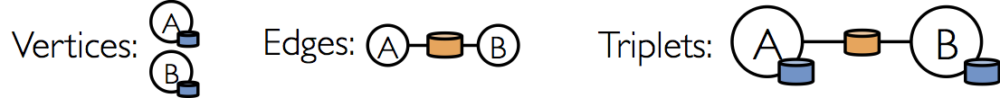
- <b>GraphFrames</b> provide an even more powerful way to select subgraphs based on a <b>combination of motif finding and DataFrame filters.</b>.
- <b>GraphFrames</b> provides three helper methods for subgraph selection. <b>filterVertices(condition), filterEdges(condition), and dropIsolatedVertices()</b>.

In [ ]:
# Select subgraph of users older than 30, 
# and relationships of type "friend".
# Drop isolated vertices (users) 
# which are not contained in any edges (relationships).

In [148]:
g.vertices.show()
g.edges.show()

+---+-------+---+
| id|   name|age|
+---+-------+---+
|  a|  Alice| 34|
|  b|    Bob| 36|
|  c|Charlie| 30|
|  d|  David| 29|
|  e| Esther| 32|
|  f|  Fanny| 36|
|  g|  Gabby| 60|
+---+-------+---+

+---+---+------------+
|src|dst|relationship|
+---+---+------------+
|  a|  b|      friend|
|  b|  c|      follow|
|  c|  b|      follow|
|  f|  c|      follow|
|  e|  f|      follow|
|  e|  d|      friend|
|  d|  a|      friend|
|  a|  e|      friend|
+---+---+------------+



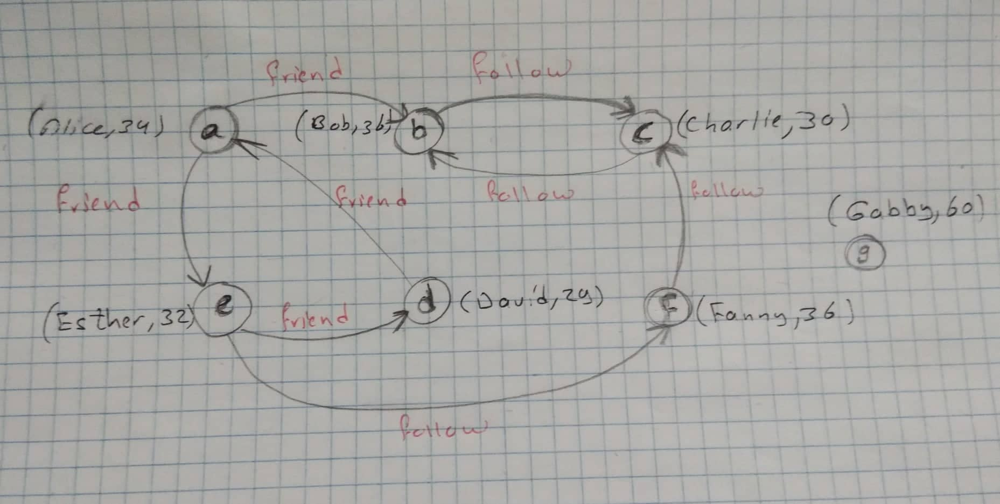

In [149]:
g1 = g.filterVertices("age>30")
g1

GraphFrame(v:[id: string, name: string ... 1 more field], e:[src: string, dst: string ... 1 more field])

In [155]:
g.vertices.show()
g.edges.show()

+---+-------+---+
| id|   name|age|
+---+-------+---+
|  a|  Alice| 34|
|  b|    Bob| 36|
|  c|Charlie| 30|
|  d|  David| 29|
|  e| Esther| 32|
|  f|  Fanny| 36|
|  g|  Gabby| 60|
+---+-------+---+

+---+---+------------+
|src|dst|relationship|
+---+---+------------+
|  a|  b|      friend|
|  b|  c|      follow|
|  c|  b|      follow|
|  f|  c|      follow|
|  e|  f|      follow|
|  e|  d|      friend|
|  d|  a|      friend|
|  a|  e|      friend|
+---+---+------------+



In [150]:
g1.vertices.show()

+---+------+---+
| id|  name|age|
+---+------+---+
|  a| Alice| 34|
|  b|   Bob| 36|
|  e|Esther| 32|
|  f| Fanny| 36|
|  g| Gabby| 60|
+---+------+---+



In [151]:
g1.edges.show()

+---+---+------------+
|src|dst|relationship|
+---+---+------------+
|  a|  b|      friend|
|  a|  e|      friend|
|  e|  f|      follow|
+---+---+------------+



In [152]:
g2 = g1.filterEdges("relationship = 'friend'")
g2.vertices.show()
g2.edges.show()

+---+------+---+
| id|  name|age|
+---+------+---+
|  a| Alice| 34|
|  b|   Bob| 36|
|  e|Esther| 32|
|  f| Fanny| 36|
|  g| Gabby| 60|
+---+------+---+

+---+---+------------+
|src|dst|relationship|
+---+---+------------+
|  a|  b|      friend|
|  a|  e|      friend|
+---+---+------------+



In [153]:
g3 = g2.dropIsolatedVertices()
g3.vertices.show()
g3.edges.show()

+---+------+---+
| id|  name|age|
+---+------+---+
|  b|   Bob| 36|
|  a| Alice| 34|
|  e|Esther| 32|
+---+------+---+

+---+---+------------+
|src|dst|relationship|
+---+---+------------+
|  a|  b|      friend|
|  a|  e|      friend|
+---+---+------------+



In [154]:
g4 = g.filterVertices("age>30")\
.filterEdges("relationship = 'friend'")\
.dropIsolatedVertices()

g4.vertices.show()
g4.edges.show()

+---+------+---+
| id|  name|age|
+---+------+---+
|  b|   Bob| 36|
|  a| Alice| 34|
|  e|Esther| 32|
+---+------+---+

+---+---+------------+
|src|dst|relationship|
+---+---+------------+
|  a|  b|      friend|
|  a|  e|      friend|
+---+---+------------+



### Complex subgraph: triplet filters: 
- The following example shows how to select a subgraph based upon triplet filters which operate on <b>an edge and its src and dst vertices</b>. 
- This example could be extended to go beyond triplets by using more complex motifs.

In [156]:
# Select subgraph based on edges "e" of type "follow"
# pointing from a younger user "a" to an older user "b".
paths = g.find("(a)-[e]->(b)")\
  .filter("e.relationship = 'follow'")\
  .filter("a.age < b.age")
paths.show()

+----------------+--------------+--------------+
|               a|             e|             b|
+----------------+--------------+--------------+
|{c, Charlie, 30}|{c, b, follow}|  {b, Bob, 36}|
| {e, Esther, 32}|{e, f, follow}|{f, Fanny, 36}|
+----------------+--------------+--------------+



In [157]:
# "paths" contains vertex info. Extract the edges.
e2 = paths.select("e.src", "e.dst", "e.relationship")
e2.show()

+---+---+------------+
|src|dst|relationship|
+---+---+------------+
|  c|  b|      follow|
|  e|  f|      follow|
+---+---+------------+



In [158]:
# Construct the subgraph
g2 = GraphFrame(g.vertices, e2)

In [159]:
g2.vertices.show()
g2.edges.show()

+---+-------+---+
| id|   name|age|
+---+-------+---+
|  a|  Alice| 34|
|  b|    Bob| 36|
|  c|Charlie| 30|
|  d|  David| 29|
|  e| Esther| 32|
|  f|  Fanny| 36|
|  g|  Gabby| 60|
+---+-------+---+

+---+---+------------+
|src|dst|relationship|
+---+---+------------+
|  c|  b|      follow|
|  e|  f|      follow|
+---+---+------------+



In [160]:
g3 = g2.dropIsolatedVertices()
g3.vertices.show()
g3.edges.show()

+---+-------+---+
| id|   name|age|
+---+-------+---+
|  c|Charlie| 30|
|  b|    Bob| 36|
|  f|  Fanny| 36|
|  e| Esther| 32|
+---+-------+---+

+---+---+------------+
|src|dst|relationship|
+---+---+------------+
|  c|  b|      follow|
|  e|  f|      follow|
+---+---+------------+



## Graph algorithms
- GraphFrames provides the same suite of standard graph algorithms as GraphX, plus some new ones. 
- Some of the algorithms are currently wrappers around GraphX implementations, so they may not be more scalable than GraphX. More algorithms will be migrated to native GraphFrames implementations in the future.

## Breadth-first search (BFS)
- Breadth-first search (BFS) finds the shortest path(s) from one vertex (or a set of vertices) to another vertex (or a set of vertices). 
- The beginning and end vertices are specified as Spark DataFrame expressions.

In [100]:
g.vertices.show()
g.edges.show()

+---+-------+---+
| id|   name|age|
+---+-------+---+
|  a|  Alice| 34|
|  b|    Bob| 36|
|  c|Charlie| 30|
|  d|  David| 29|
|  e| Esther| 32|
|  f|  Fanny| 36|
|  g|  Gabby| 60|
+---+-------+---+

+---+---+------------+
|src|dst|relationship|
+---+---+------------+
|  a|  b|      friend|
|  b|  c|      follow|
|  c|  b|      follow|
|  f|  c|      follow|
|  e|  f|      follow|
|  e|  d|      friend|
|  d|  a|      friend|
|  a|  e|      friend|
+---+---+------------+



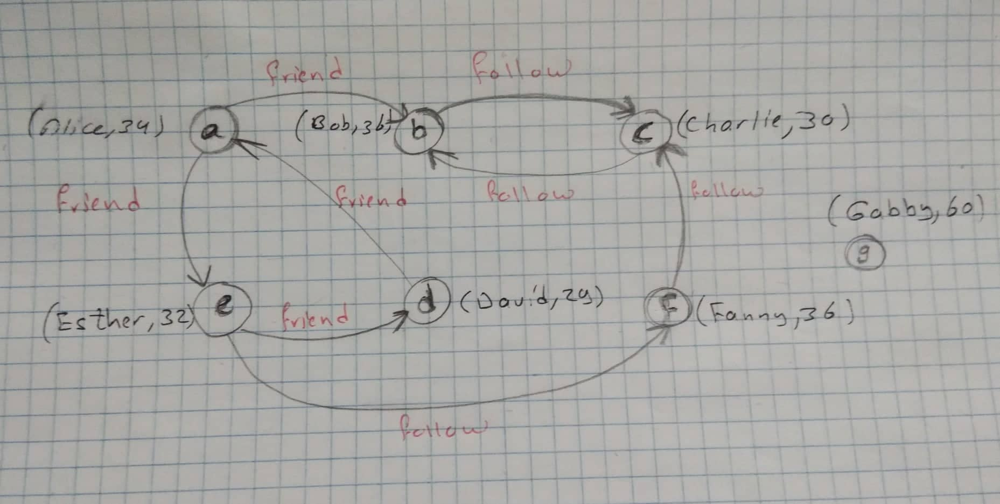

In [161]:
# Search from "Esther" for users of age < 32.
paths = g.bfs("name = 'Esther'", "age < 32")
paths.show()

+---------------+--------------+--------------+
|           from|            e0|            to|
+---------------+--------------+--------------+
|{e, Esther, 32}|{e, d, friend}|{d, David, 29}|
+---------------+--------------+--------------+



In [172]:
g.bfs("name = 'Esther'","age<32",\
      edgeFilter="relationship !='friend'",maxPathLength=3).show()

+---------------+--------------+--------------+--------------+----------------+
|           from|            e0|            v1|            e1|              to|
+---------------+--------------+--------------+--------------+----------------+
|{e, Esther, 32}|{e, f, follow}|{f, Fanny, 36}|{f, c, follow}|{c, Charlie, 30}|
+---------------+--------------+--------------+--------------+----------------+



In [173]:
g.bfs("name = 'Esther'","name='Bob'",\
      edgeFilter="relationship !='friend'",maxPathLength=3).show()

+---------------+--------------+--------------+--------------+----------------+--------------+------------+
|           from|            e0|            v1|            e1|              v2|            e2|          to|
+---------------+--------------+--------------+--------------+----------------+--------------+------------+
|{e, Esther, 32}|{e, f, follow}|{f, Fanny, 36}|{f, c, follow}|{c, Charlie, 30}|{c, b, follow}|{b, Bob, 36}|
+---------------+--------------+--------------+--------------+----------------+--------------+------------+



In [174]:
g.bfs("name = 'Esther'","name='Bob'",\
      edgeFilter="relationship !='friend'",maxPathLength=2).show()

+---+----+---+
| id|name|age|
+---+----+---+
+---+----+---+



In [175]:
g.bfs("name = 'Esther'","name='Bob'",\
      edgeFilter="relationship ='friend'",maxPathLength=3).show()

+---------------+--------------+--------------+--------------+--------------+--------------+------------+
|           from|            e0|            v1|            e1|            v2|            e2|          to|
+---------------+--------------+--------------+--------------+--------------+--------------+------------+
|{e, Esther, 32}|{e, d, friend}|{d, David, 29}|{d, a, friend}|{a, Alice, 34}|{a, b, friend}|{b, Bob, 36}|
+---------------+--------------+--------------+--------------+--------------+--------------+------------+



## Connected components
- Computes the connected component membership of each vertex and returns a graph with each vertex assigned a component ID.
- In graph theory, a component of an undirected graph is an induced subgraph in which any two vertices are connected to each other by paths, and which is connected to no additional vertices in the rest of the graph. 
- For example, the graph shown in the illustration has three components. A vertex with no incident edges is itself a component. A graph that is itself connected has exactly one component, consisting of the whole graph. 
- Components are also sometimes called connected components.
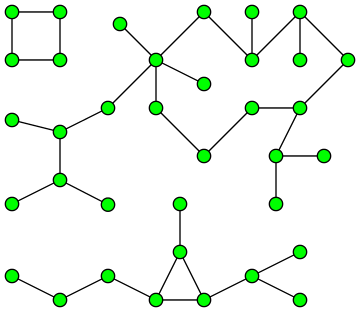

In [176]:
g.vertices.show()
g.edges.show()

+---+-------+---+
| id|   name|age|
+---+-------+---+
|  a|  Alice| 34|
|  b|    Bob| 36|
|  c|Charlie| 30|
|  d|  David| 29|
|  e| Esther| 32|
|  f|  Fanny| 36|
|  g|  Gabby| 60|
+---+-------+---+

+---+---+------------+
|src|dst|relationship|
+---+---+------------+
|  a|  b|      friend|
|  b|  c|      follow|
|  c|  b|      follow|
|  f|  c|      follow|
|  e|  f|      follow|
|  e|  d|      friend|
|  d|  a|      friend|
|  a|  e|      friend|
+---+---+------------+



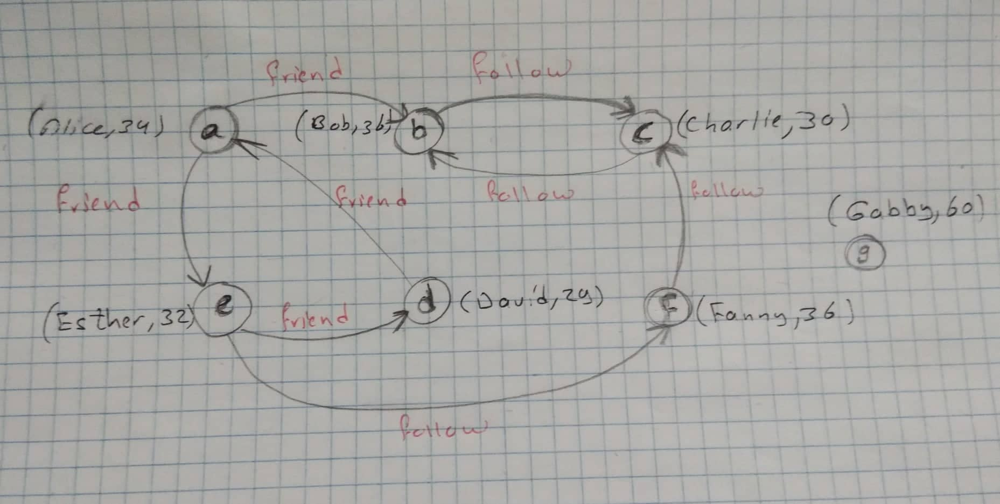

In [179]:
spark.sparkContext.setCheckpointDir("chkpointsdir")
result = g.connectedComponents()

22/06/11 23:53:18 WARN CacheManager: Asked to cache already cached data.
22/06/11 23:53:20 WARN CacheManager: Asked to cache already cached data.        
22/06/11 23:53:22 WARN CacheManager: Asked to cache already cached data.        
22/06/11 23:53:22 WARN CacheManager: Asked to cache already cached data.
22/06/11 23:53:24 WARN CacheManager: Asked to cache already cached data.        
22/06/11 23:53:27 WARN CacheManager: Asked to cache already cached data.        
22/06/11 23:53:33 WARN CacheManager: Asked to cache already cached data.        
22/06/11 23:53:33 WARN CacheManager: Asked to cache already cached data.


In [180]:
result.show()

+---+-------+---+------------+
| id|   name|age|   component|
+---+-------+---+------------+
|  a|  Alice| 34|412316860416|
|  b|    Bob| 36|412316860416|
|  c|Charlie| 30|412316860416|
|  d|  David| 29|412316860416|
|  e| Esther| 32|412316860416|
|  f|  Fanny| 36|412316860416|
|  g|  Gabby| 60|146028888064|
+---+-------+---+------------+



In [181]:
result.select("id", "component").orderBy("component").show()

+---+------------+
| id|   component|
+---+------------+
|  g|146028888064|
|  d|412316860416|
|  f|412316860416|
|  e|412316860416|
|  a|412316860416|
|  b|412316860416|
|  c|412316860416|
+---+------------+



## Strongly connected components
- Compute the strongly connected component (SCC) of each vertex and return a graph with each vertex assigned to the SCC containing that vertex.
- In the mathematical theory of directed graphs, a graph is said to be strongly connected if every vertex is reachable from every other vertex. 
- The strongly connected components of an arbitrary directed graph form a partition into subgraphs that are themselves strongly connected.
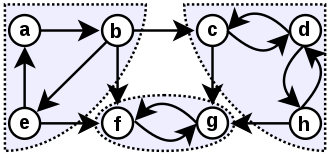
<b><i><center>Graph with strongly connected components marked</center></i></b>

In [184]:
result = g.stronglyConnectedComponents(maxIter=10)

In [185]:
result.show()

+---+-------+---+-------------+
| id|   name|age|    component|
+---+-------+---+-------------+
|  g|  Gabby| 60| 146028888064|
|  f|  Fanny| 36| 412316860416|
|  e| Esther| 32| 670014898176|
|  d|  David| 29| 670014898176|
|  c|Charlie| 30|1047972020224|
|  b|    Bob| 36|1047972020224|
|  a|  Alice| 34| 670014898176|
+---+-------+---+-------------+



In [186]:
result.select("id","component").orderBy("component").show()

+---+-------------+
| id|    component|
+---+-------------+
|  g| 146028888064|
|  f| 412316860416|
|  d| 670014898176|
|  a| 670014898176|
|  e| 670014898176|
|  c|1047972020224|
|  b|1047972020224|
+---+-------------+



## Label Propagation Algorithm (LPA)
- Run static Label Propagation Algorithm for detecting communities in networks.
- Each node in the network is initially assigned to its own community. At every superstep, nodes send their community affiliation to all neighbors and update their state to the mode community affiliation of incoming messages.
- LPA is a standard community detection algorithm for graphs. It is very inexpensive computationally, although <b>(1)</b> convergence is not guaranteed and <b>(2)</b> one can end up with trivial solutions (all nodes are identified into a single community).

In [187]:
result = g.labelPropagation(maxIter=5)

In [188]:
result.show()

+---+-------+---+-------------+
| id|   name|age|        label|
+---+-------+---+-------------+
|  g|  Gabby| 60| 146028888064|
|  f|  Fanny| 36|1047972020224|
|  e| Esther| 32|1460288880640|
|  d|  David| 29|1460288880640|
|  c|Charlie| 30|1382979469312|
|  b|    Bob| 36|1047972020224|
|  a|  Alice| 34|1382979469312|
+---+-------+---+-------------+



In [191]:
result.select("id", "label").orderBy('label').show()

+---+-------------+
| id|        label|
+---+-------------+
|  g| 146028888064|
|  f|1047972020224|
|  b|1047972020224|
|  a|1382979469312|
|  c|1382979469312|
|  e|1460288880640|
|  d|1460288880640|
+---+-------------+



## PageRank
- PageRank (PR) is an algorithm used by Google Search to rank web pages in their search engine results. It is named after both the term "web page" and co-founder Larry Page. PageRank is a way of measuring the importance of website pages. 
- According to Google: PageRank works by counting the number and quality of links to a page to determine a rough estimate of how important the website is. The underlying assumption is that more important websites are likely to receive more links from other websites.

There are two implementations of PageRank.
- The first one uses the org.apache.spark.graphx.graph interface with aggregateMessages and runs PageRank for a fixed number of iterations. This can be executed by setting maxIter.
- The second implementation uses the org.apache.spark.graphx.Pregel interface and runs PageRank until convergence and this can be run by setting tol.
#### <br>Both implementations support non-personalized and personalized PageRank, where setting a sourceId personalizes the results for that vertex.

In [192]:
# Run PageRank until convergence to tolerance "tol".
results = g.pageRank(resetProbability=0.15, tol=0.01)

In [193]:
results

GraphFrame(v:[id: string, name: string ... 2 more fields], e:[src: string, dst: string ... 2 more fields])

In [194]:
results.vertices.show()
results.edges.show()

+---+-------+---+-------------------+
| id|   name|age|           pagerank|
+---+-------+---+-------------------+
|  g|  Gabby| 60| 0.1799821386239711|
|  f|  Fanny| 36| 0.3283606792049851|
|  e| Esther| 32|0.37085233187676075|
|  d|  David| 29| 0.3283606792049851|
|  c|Charlie| 30| 2.6878300011606218|
|  b|    Bob| 36|  2.655507832863289|
|  a|  Alice| 34|0.44910633706538744|
+---+-------+---+-------------------+



+---+---+------------+------+
|src|dst|relationship|weight|
+---+---+------------+------+
|  f|  c|      follow|   1.0|
|  e|  f|      follow|   0.5|
|  e|  d|      friend|   0.5|
|  d|  a|      friend|   1.0|
|  c|  b|      follow|   1.0|
|  b|  c|      follow|   1.0|
|  a|  e|      friend|   0.5|
|  a|  b|      friend|   0.5|
+---+---+------------+------+



In [196]:
results.vertices.orderBy('pagerank',ascending=False).show()
results.edges.orderBy('weight',ascending=False).show()

+---+-------+---+-------------------+
| id|   name|age|           pagerank|
+---+-------+---+-------------------+
|  c|Charlie| 30| 2.6878300011606218|
|  b|    Bob| 36|  2.655507832863289|
|  a|  Alice| 34|0.44910633706538744|
|  e| Esther| 32|0.37085233187676075|
|  f|  Fanny| 36| 0.3283606792049851|
|  d|  David| 29| 0.3283606792049851|
|  g|  Gabby| 60| 0.1799821386239711|
+---+-------+---+-------------------+



+---+---+------------+------+
|src|dst|relationship|weight|
+---+---+------------+------+
|  f|  c|      follow|   1.0|
|  d|  a|      friend|   1.0|
|  c|  b|      follow|   1.0|
|  b|  c|      follow|   1.0|
|  e|  f|      follow|   0.5|
|  a|  b|      friend|   0.5|
|  e|  d|      friend|   0.5|
|  a|  e|      friend|   0.5|
+---+---+------------+------+



In [197]:
results.vertices.select("id", "pagerank").orderBy('pagerank').show()
results.edges.select("src", "dst", "weight").orderBy('weight').show()

+---+-------------------+
| id|           pagerank|
+---+-------------------+
|  g| 0.1799821386239711|
|  f| 0.3283606792049851|
|  d| 0.3283606792049851|
|  e|0.37085233187676075|
|  a|0.44910633706538744|
|  b|  2.655507832863289|
|  c| 2.6878300011606218|
+---+-------------------+



+---+---+------+
|src|dst|weight|
+---+---+------+
|  e|  f|   0.5|
|  e|  d|   0.5|
|  a|  e|   0.5|
|  a|  b|   0.5|
|  f|  c|   1.0|
|  b|  c|   1.0|
|  d|  a|   1.0|
|  c|  b|   1.0|
+---+---+------+



In [198]:
# Run PageRank for a fixed number of iterations.
results2 = g.pageRank(resetProbability=0.15, maxIter=10)
results2.vertices.select("id", "pagerank").orderBy('pagerank').show()
results2.edges.select("src", "dst", "weight").orderBy('weight').show()

+---+-------------------+
| id|           pagerank|
+---+-------------------+
|  g|0.17073170731707318|
|  f|0.32504910549694244|
|  d|0.32504910549694244|
|  e| 0.3613490987992571|
|  a| 0.4485115093698443|
|  c| 2.6667877057849627|
|  b| 2.7025217677349773|
+---+-------------------+



+---+---+------+
|src|dst|weight|
+---+---+------+
|  e|  f|   0.5|
|  e|  d|   0.5|
|  a|  e|   0.5|
|  a|  b|   0.5|
|  f|  c|   1.0|
|  b|  c|   1.0|
|  d|  a|   1.0|
|  c|  b|   1.0|
+---+---+------+



In [199]:
# Run PageRank personalized for vertex "a"
results3 = g.pageRank(resetProbability=0.15, maxIter=10, sourceId="a")
results3.vertices.select("id", "pagerank").orderBy('pagerank').show()
results3.edges.select("src", "dst", "weight").orderBy('weight').show()

+---+-------------------+
| id|           pagerank|
+---+-------------------+
|  g|                0.0|
|  f|0.03189213697274781|
|  d|0.03189213697274781|
|  e|0.07657840357273027|
|  a|0.17710831642683564|
|  b| 0.3366143039702568|
|  c| 0.3459147020846817|
+---+-------------------+



+---+---+------+
|src|dst|weight|
+---+---+------+
|  e|  f|   0.5|
|  e|  d|   0.5|
|  a|  e|   0.5|
|  a|  b|   0.5|
|  f|  c|   1.0|
|  b|  c|   1.0|
|  d|  a|   1.0|
|  c|  b|   1.0|
+---+---+------+



In [200]:
# Run PageRank personalized for vertex ["a", "b", "c", "d"] in parallel
results4 = g.parallelPersonalizedPageRank(resetProbability=0.15, sourceIds=["a", "b", "c", "d"], maxIter=10)

In [201]:
results4.vertices.show(truncate=False)
results4.edges.show()

+---+-------+---+---------------------------------------------------------------------------------------------+
|id |name   |age|pageranks                                                                                    |
+---+-------+---+---------------------------------------------------------------------------------------------+
|g  |Gabby  |60 |(4,[0,1,2,3],[0.0,0.0,0.0,0.0])                                                              |
|f  |Fanny  |36 |(4,[0,1,2,3],[0.035718392537920036,0.0,0.0,0.02851161839911455])                             |
|e  |Esther |32 |(4,[0,1,2,3],[0.08404327655981184,0.0,0.0,0.06708616093909306])                              |
|d  |David  |29 |(4,[0,1,2,3],[0.035718392537920036,0.0,0.0,0.18627658958092722])                             |
|c  |Charlie|30 |(4,[0,1,2,3],[0.3570167371682629,0.36900365205966795,0.6309963479403321,0.22173056767093213])|
|b  |Bob    |36 |(4,[0,1,2,3],[0.28914633432104564,0.6309963479403321,0.36900365205966795,0.335309868305

+---+---+------------+------+
|src|dst|relationship|weight|
+---+---+------------+------+
|  f|  c|      follow|   1.0|
|  e|  f|      follow|   0.5|
|  e|  d|      friend|   0.5|
|  d|  a|      friend|   1.0|
|  c|  b|      follow|   1.0|
|  b|  c|      follow|   1.0|
|  a|  e|      friend|   0.5|
|  a|  b|      friend|   0.5|
+---+---+------------+------+



## Shortest paths
- Computes shortest paths from each vertex to the given set of landmark vertices, where landmarks are specified by vertex ID. Note that this takes edge direction into account.

In [202]:
results = g.shortestPaths(landmarks=["a", "d"])

In [203]:
results.show()

+---+-------+---+----------------+
| id|   name|age|       distances|
+---+-------+---+----------------+
|  g|  Gabby| 60|              {}|
|  f|  Fanny| 36|              {}|
|  e| Esther| 32|{a -> 2, d -> 1}|
|  d|  David| 29|{a -> 1, d -> 0}|
|  c|Charlie| 30|              {}|
|  b|    Bob| 36|              {}|
|  a|  Alice| 34|{a -> 0, d -> 2}|
+---+-------+---+----------------+



In [204]:
results.select("id", "distances").show()

+---+----------------+
| id|       distances|
+---+----------------+
|  g|              {}|
|  f|              {}|
|  e|{a -> 2, d -> 1}|
|  d|{a -> 1, d -> 0}|
|  c|              {}|
|  b|              {}|
|  a|{a -> 0, d -> 2}|
+---+----------------+



## Triangle count
- Computes the number of triangles passing through each vertex.

In [205]:
results = g.triangleCount()

In [206]:
results.show()

+-----+---+-------+---+
|count| id|   name|age|
+-----+---+-------+---+
|    0|  c|Charlie| 30|
|    0|  b|    Bob| 36|
|    1|  a|  Alice| 34|
|    0|  g|  Gabby| 60|
|    0|  f|  Fanny| 36|
|    1|  e| Esther| 32|
|    1|  d|  David| 29|
+-----+---+-------+---+



In [207]:
results.select("id", "count").orderBy('count').show()

+---+-----+
| id|count|
+---+-----+
|  c|    0|
|  f|    0|
|  b|    0|
|  g|    0|
|  a|    1|
|  e|    1|
|  d|    1|
+---+-----+



In [208]:
results.select("id", "count").orderBy('id').show()

+---+-----+
| id|count|
+---+-----+
|  a|    1|
|  b|    0|
|  c|    0|
|  d|    1|
|  e|    1|
|  f|    0|
|  g|    0|
+---+-----+



## Saving and loading GraphFrames
- Since GraphFrames are built around DataFrames, they automatically support saving and loading to and from the same set of datasources. 

In [209]:
# Save vertices and edges as Parquet to some location.
g.vertices.write.parquet("vertices")
g.edges.write.parquet("edges")

In [210]:
# Load the vertices and edges back.
sameV = spark.read.parquet("vertices")
sameE = spark.read.parquet("edges")

In [211]:
# Create an identical GraphFrame.
sameG = GraphFrame(sameV, sameE)

### References:
- https://graphframes.github.io/graphframes/docs/_site/index.html
- https://graphframes.github.io/graphframes/docs/_site/user-guide.html
- https://theidearises.com/2020/07/07/what-is-the-role-of-graphx-and-graphframes-in-machine-learning/
- https://en.wikipedia.org/wiki/Directed_graph
- https://en.wikipedia.org/wiki/Network_motif
- https://en.wikipedia.org/wiki/Domain-specific_language
- https://en.wikipedia.org/wiki/Component_(graph_theory)
- https://en.wikipedia.org/wiki/Strongly_connected_component
- https://en.wikipedia.org/wiki/Label_propagation_algorithm
- https://en.wikipedia.org/wiki/PageRank